# Preliminaries

Import Libraries

In [1]:
import pandas as pd
from datasets import load_dataset

import sentencepiece as spm

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, TensorDataset
from torch.nn.utils.rnn import pad_sequence
from torch.nn.functional import cosine_similarity

from tqdm import tqdm 

import random
import os

/home/eli/miniconda3/envs/search/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Set the device

In [2]:
if torch.cuda.is_available():
    print("CUDA is available. GPU can be used.")
else:
    print("CUDA is not available. Running on CPU.")

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

CUDA is available. GPU can be used.


Set the hyperparameters

In [3]:
# Hyperparameters
vocab_size = 16000  # Number of tokens in the vocabulary
embedding_dim = 300  # The dimension of the word embeddings
window_size = 2  # The context size
encoding_dim = 512
batch_size = 32
margin = 1
learning_rate = 0.001
cbow_epochs = 200
epochs = 10

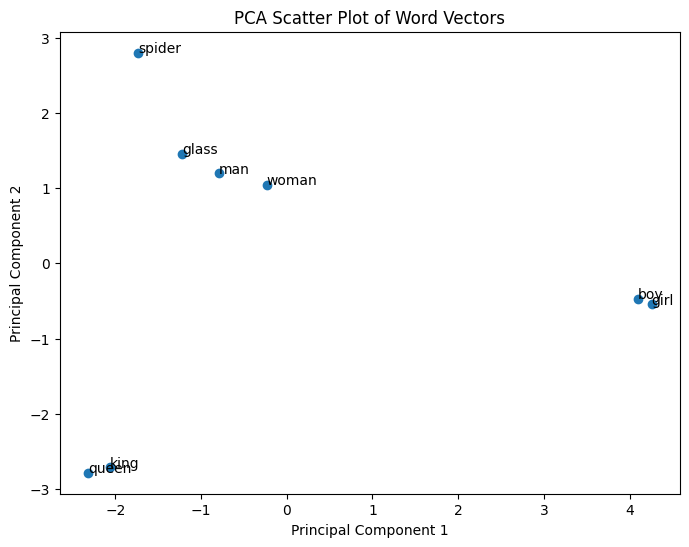

In [4]:
from gensim.models import Word2Vec
from sklearn.decomposition import PCA
import numpy as np
import matplotlib.pyplot as plt

model_path = "./artifacts/word2vec-300.bin"
skipgram_model = Word2Vec.load(model_path)
# model.wv['what']



plot_words = ["king", "queen", "man", "woman", "glass", "boy","girl", "spider"]


## apply PCA
word_matrix = np.array([skipgram_model.wv[word] for word in plot_words])
num_components = 3  # Number of principal components to keep
pca = PCA(n_components=num_components)
pca_result = pca.fit_transform(word_matrix)
pca_result

plt.figure(figsize=(8, 6))
plt.scatter(pca_result[:, 0], pca_result[:, 1], marker='o')

# Annotate points with the corresponding words
for i, word in enumerate(plot_words):
    plt.annotate(word, (pca_result[i, 0], pca_result[i, 1]))

# Add labels and a title
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("PCA Scatter Plot of Word Vectors")

# Show the plot
plt.show()


# Importing and processing the data

Import the dataset

In [15]:
dataset = load_dataset("ms_marco", "v1.1")

Split into train, val, test

In [16]:
val_data = dataset["validation"]
val_df = pd.DataFrame(val_data)

train_data = dataset["train"]
train_df = pd.DataFrame(train_data)

test_data = dataset["test"]
test_df = pd.DataFrame(test_data)

Method for extracting queries, lists of relevant documents for each query, and the set of all unique documents

In [13]:
def df_to_lists(df):
    queries = df['query'].tolist()
    lists_of_documents = df['passages'].tolist()
    all_documents = []
    for document_list in lists_of_documents:
        for document in document_list["passage_text"]:
            all_documents.append(document)
    unique_documents = list(set(all_documents))
    return queries, lists_of_documents, unique_documents

Create the text corpus

In [17]:
from gensim.utils import simple_preprocess

# Making a text corpus
train_queries, train_lists_of_documents, train_unique_documents  = df_to_lists(train_df)
val_queries, val_lists_of_documents, val_unique_documents  = df_to_lists(val_df)
test_queries, test_lists_of_documents, test_unique_documents  = df_to_lists(test_df)

# with open('corpus.txt', 'w') as file:
#     for query in train_queries:
#         file.write(f'{query}\n')
#     for document_list in train_lists_of_documents:
#         for document in document_list["passage_text"]:
#             file.write(f'{document}\n')
        
#     for query in val_queries:
#         file.write(f'{query}\n')
#     for document_list in val_lists_of_documents:
#         for document in document_list["passage_text"]:
#             file.write(f'{document}\n')
            
#     for query in test_queries:
#         file.write(f'{query}\n')
#     for document_list in test_lists_of_documents:
#         for document in document_list["passage_text"]:
#             file.write(f'{document}\n')

# def train_model(sentences, epochs=10):
#     model = Word2Vec(sentences=sentences, vector_size=300, window=5, min_count=1, sg=1, workers=5)  # sg=1 indicates Skip-Gram
#     model.build_vocab(sentences, update=True, progress_per=10000)
#     model.train(sentences, total_examples=model.corpus_count, epochs=epochs)
#     return model

# all_sentences = train_queries + val_queries + test_queries + train_unique_documents + val_unique_documents + test_unique_documents
# tokenized_sentences = [simple_preprocess(sentence) for sentence in all_sentences]

# skipgram_model = train_model(tokenized_sentences)
# model_path = "./artifacts/word2vec-300.bin"
# skipgram_model.save(model_path)

In [11]:
tokenized_sentences

[['what', 'is', 'rba'],
 ['was', 'ronald', 'reagan', 'democrat'],
 ['how',
  'long',
  'do',
  'you',
  'need',
  'for',
  'sydney',
  'and',
  'surrounding',
  'areas'],
 ['price', 'to', 'install', 'tile', 'in', 'shower'],
 ['why', 'conversion', 'observed', 'in', 'body'],
 ['where', 'are', 'the', 'lungs', 'located', 'in', 'the', 'back'],
 ['cost', 'to', 'get', 'patent'],
 ['what',
  'does',
  'metabolic',
  'acidosis',
  'need',
  'to',
  'reverse',
  'the',
  'condition'],
 ['best', 'tragedies', 'of', 'ancient', 'greece'],
 ['what', 'is', 'conifer'],
 ['in',
  'animals',
  'somatic',
  'cells',
  'are',
  'produced',
  'by',
  'and',
  'gametic',
  'cells',
  'are',
  'produced',
  'by'],
 ['remembering',
  'the',
  'name',
  'of',
  'the',
  'author',
  'who',
  'wrote',
  'the',
  'cat',
  'in',
  'the',
  'hat'],
 ['how', 'long', 'cooking', 'chicken', 'legs', 'in', 'the', 'big', 'easy'],
 ['average', 'cost', 'of', 'heating', 'per', 'square', 'foot'],
 ['is', 'mount', 'pinatubo', '

Train SentencePiece on the test corpus to produce a tokenizer

In [13]:
# Train SentencePiece model
# spm.SentencePieceTrainer.train(input="corpus.txt", model_prefix="search_engine", vocab_size=vocab_size)

Method for tokenizing and generating the labelled input data: triples of (query, relevant document, irrelevant document)

In [9]:
from gensim.utils import simple_preprocess

def generate_labelled_dataset(df, tokenizer_model):
    queries, lists_of_documents, unique_documents = df_to_lists(df)
    
    tokenized_queries = []
    tokenized_positive_documents = []
    tokenized_negative_documents = []
    
    # sp = spm.SentencePieceProcessor()
    # sp.load(tokenizer_model)
    counter = 0
    for document_list in lists_of_documents:
        for document in document_list["passage_text"]:
            
            query_tokens = simple_preprocess(queries[counter])
            # embeddings = [tokenizer_model.wv[word] for word in query_tokens]
            tokenized_queries.append(query_tokens)
            
            positive_doc_tokens = simple_preprocess(document)
            tokenized_positive_documents.append(positive_doc_tokens)
            # tokenized_positive_documents.append([tokenizer_model.wv[word] for word in positive_doc_tokens])
            
            # Randomly select an irrelevant (negative) document by *negative sampling* 
            random_integer = random.randint(0, len(unique_documents)-1)
            negative_doc_tokens = simple_preprocess(unique_documents[random_integer])
            tokenized_negative_documents.append(negative_doc_tokens)
            # tokenized_negative_documents.append([tokenizer_model.wv[word] for word in negative_doc_tokens])
            
        counter+= 1
        
    return tokenized_queries, tokenized_positive_documents, tokenized_negative_documents

Process our dataset to product our labelled input data

In [18]:
train_tokenized_queries, train_tokenized_positive_documents, train_tokenized_negative_documents = generate_labelled_dataset(train_df, skipgram_model)

val_tokenized_queries, val_tokenized_positive_documents, val_tokenized_negative_documents  = generate_labelled_dataset(val_df, skipgram_model)

test_tokenized_queries, test_tokenized_positive_documents, test_tokenized_negative_documents  = generate_labelled_dataset(test_df, skipgram_model)

Create Dataset class for Dataloader later

In [8]:
class TokenIdDataset(Dataset):
    def __init__(self, tokenized_queries, tokenized_positive_documents, tokenized_negative_documents, tokenizer_model):
        self.tokenized_queries = tokenized_queries
        self.tokenized_positive_documents = tokenized_positive_documents
        self.tokenized_negative_documents = tokenized_negative_documents
        self.tokenizer_model = tokenizer_model
    def __len__(self):
        return len(self.tokenized_queries)
    
    def __getitem__(self, index):
        query_embedding = torch.tensor(np.array([self.tokenizer_model.wv[word] for word in self.tokenized_queries[index]], dtype=np.float32))
        positive_doc_embedding = torch.tensor(np.array([self.tokenizer_model.wv[word] for word in self.tokenized_positive_documents[index]], dtype=np.float32))
        negative_doc_embedding = torch.tensor(np.array([self.tokenizer_model.wv[word] for word in self.tokenized_negative_documents[index]], dtype=np.float32))

        return query_embedding, positive_doc_embedding, negative_doc_embedding

Create Collate Function for Dataloader later 

In [7]:
# A function for padding to the left
def pad_left(data, batch_first=True, padding_value=0):
    right_data = pad_sequence(data, batch_first, padding_value)
    left_data = torch.zeros_like(right_data)
    for i, datum in enumerate(data):
        left_data[i, -len(data[i]):] = datum
    return left_data

# A custom collate function to pad the sequences to the maximum length found in the batch for each of the three lists.
def pad_collate(batch):
    data1, data2, data3 = zip(*batch)
    data1_padded = pad_left(data1, batch_first=True, padding_value=0)
    data2_padded = pad_left(data2, batch_first=True, padding_value=0)
    data3_padded = pad_left(data3, batch_first=True, padding_value=0)
    return data1_padded, data2_padded, data3_padded

Create datasets and dataloaders for batching our data

In [21]:
# # Create DataLoaders for training, validation, and test sets
train_dataset = TokenIdDataset(train_tokenized_queries, train_tokenized_positive_documents, train_tokenized_negative_documents, skipgram_model)
train_data_loader = DataLoader(train_dataset, batch_size=1, shuffle=False, collate_fn=pad_collate)

val_dataset = TokenIdDataset(val_tokenized_queries, val_tokenized_positive_documents, val_tokenized_negative_documents, skipgram_model)
val_data_loader = DataLoader(val_dataset, batch_size=1, shuffle=False, collate_fn=pad_collate)

test_dataset = TokenIdDataset(test_tokenized_queries, test_tokenized_positive_documents, test_tokenized_negative_documents, skipgram_model)
test_data_loader = DataLoader(test_dataset, batch_size=1, shuffle=False, collate_fn=pad_collate)


Tokenize queries to use in our word2vec embedding model

In [15]:
queries = train_queries + val_queries + test_queries

sp = spm.SentencePieceProcessor()
sp.load("search_engine.model")

tokenized_queries = [sp.encode_as_ids(query) for query in queries]

## Building the Word2Vec Embedding

### CBOW

In [15]:
# Generate all the pairs of tokens and context windows for CBOW
def generate_cbow_pairs(tokenized_sentences, window_size=2):
    cbow_pairs = []
    for sentence in tokenized_sentences:
        sentence_length = len(sentence)
        for index, word in enumerate(sentence):
            start = index - window_size
            end = index + window_size + 1
            
            context = [sentence[i] for i in range(start, end) if 0 <= i < sentence_length and i != index]
            target = word
            cbow_pairs.append((context, target))
    return cbow_pairs

In [19]:
# A `Dataset` class for generating pairs of tokens and context windows for CBOW one at a time, to use in the `DataLoader` to generate mini-batches
class CBOWDataset(Dataset):
    def __init__(self, cbow_pairs, context_size):
        self.cbow_pairs = cbow_pairs
        self.context_size = context_size

    def __len__(self):
        return len(self.cbow_pairs)

    def __getitem__(self, idx):
        context, target = self.cbow_pairs[idx]
        # Pad or trim the context to ensure uniform size
        if len(context) < 2 * self.context_size:
            context += [0] * (2 * self.context_size - len(context))  # Assuming 0 is the padding index
        else:
            context = context[:2 * self.context_size]
        return torch.tensor(context, dtype=torch.long), torch.tensor(target, dtype=torch.long)

In [18]:
# The CBOW model, which is just an embedding layer, an average pooling, and a final output linear layer followed by a softmax activation
class CBOWModel(nn.Module):
    def __init__(self, vocab_size, embedding_dim):
        super(CBOWModel, self).__init__()
        self.embeddings = nn.Embedding(vocab_size, embedding_dim)
        self.linear = nn.Linear(embedding_dim, vocab_size)

    def forward(self, context_words):
        embedded = self.embeddings(context_words)
        projection = torch.mean(embedded, dim=1)
        out = self.linear(projection)
        log_probs = nn.functional.log_softmax(out, dim=1)
        return log_probs
    
    def embed(self, word):
        self.eval()
        embedding = self.embeddings(word)
        return embedding

In [18]:
# # Applying the data generating functions we wrote earlier to our data
cbow_pairs = generate_cbow_pairs(tokenized_queries, window_size)
cbow_dataset = CBOWDataset(cbow_pairs, window_size)
cbow_dataloader = DataLoader(cbow_dataset, batch_size=batch_size, shuffle=True)

In [24]:
# # Model, loss, and optimizer
# cbow_model = CBOWModel(vocab_size, embedding_dim)  # Assuming CBOWModel is defined as before
# cbow_model = cbow_model.to(device)
# cbow_loss_function = nn.NLLLoss()
# cbow_optimizer = optim.SGD(cbow_model.parameters(), lr=learning_rate)

# # Training loop
# for epoch in range(cbow_epochs):
#     total_loss = 0
#     with tqdm(cbow_dataloader, unit="batch") as tepoch:
#         for context, target in tepoch:
#             context, target = context.to(device), target.to(device)
#             tepoch.set_description(f"Epoch {epoch+1}")
            
#             cbow_model.zero_grad()
#             log_probs = cbow_model(context)
#             loss = cbow_loss_function(log_probs, target)
#             loss.backward()
#             cbow_optimizer.step()

#             total_loss += loss.item()
#             tepoch.set_postfix(loss=loss.item())

#     print(f"Epoch {epoch+1} finished with total loss: {total_loss:.4f}")
#     torch.save(cbow_model.state_dict(), os.path.join("cbow_weights", f"cbow_epoch_{epoch+1}.pth"))

# Building the Two Tower Model 

Two Tower Architecture: one RNN for encoding queries and another RNN for encoding queries

In [28]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class Attention(nn.Module):
    def __init__(self, enc_dim):
        super(Attention, self).__init__()
        self.query_layer = nn.Linear(enc_dim, enc_dim)

    def forward(self, encoder_outputs, hidden):
        # hidden expected shape: [batch_size, enc_dim]
        # encoder_outputs expected shape: [batch_size, seq_len, enc_dim]
        hidden = self.query_layer(hidden)  # Transform hidden state to make it suitable for scoring
        hidden = hidden.unsqueeze(2)  # [batch_size, enc_dim, 1] for batch matrix multiplication

        # Compute attention scores and apply softmax
        attention_scores = torch.bmm(encoder_outputs, hidden)  # [batch_size, seq_len, 1]
        attention_weights = F.softmax(attention_scores, dim=1)  # Apply softmax over seq_len

        # Compute context vector
        context_vector = torch.bmm(encoder_outputs.transpose(1, 2), attention_weights)  # [batch_size, enc_dim, 1]
        context_vector = context_vector.squeeze(2)  # Squeeze to remove last dimension [batch_size, enc_dim]
        return context_vector

class Two_Towers(nn.Module):
    def __init__(self, embedding_dim, encoding_dim):
        super(Two_Towers, self).__init__()
        # Adjust the hidden size for bidirectional LSTM
        half_encoding_dim = encoding_dim // 2  # Divide by 2 to get 256 if encoding_dim is 512
        self.query_encoder = nn.LSTM(embedding_dim, half_encoding_dim, batch_first=True, bidirectional=True)
        self.document_encoder = nn.LSTM(embedding_dim, half_encoding_dim, batch_first=True, bidirectional=True)

        # Initialize attention with full encoding_dim as it expects concatenated output
        self.attention = Attention(encoding_dim)
        self.passage_attention_encoder = nn.LSTM(encoding_dim, encoding_dim, batch_first=True)

    def encode_query(self, query_embeddings):
        _, (hidden, _) = self.query_encoder(query_embeddings)
        # Concatenate hidden states from both directions to form the full encoding_dim output
        hidden = torch.cat((hidden[0], hidden[1]), dim=1)
        return hidden

    def encode_document(self, document_embeddings, query_hidden):
        # Encode document using bidirectional LSTM
        output, _ = self.document_encoder(document_embeddings)
        # Apply attention mechanism using query hidden state
        context_vector = self.attention(output, query_hidden)
        # Further refine context vector through passage attention encoder
        _, (hidden, _) = self.passage_attention_encoder(context_vector.unsqueeze(1))
        return hidden.squeeze(0)

    def forward(self, query_embeddings, positive_document_embeddings, negative_document_embeddings):
        query_encoding = self.encode_query(query_embeddings)
        positive_document_encoding = self.encode_document(positive_document_embeddings, query_encoding)
        negative_document_encoding = self.encode_document(negative_document_embeddings, query_encoding)
        return query_encoding, positive_document_encoding, negative_document_encoding

# class Two_Towers(nn.Module):
#     def __init__(self, embedding_dim, encoding_dim):
#         super(Two_Towers, self).__init__()
#         # Enable bidirectional on both LSTMs
#         self.query_encoding = nn.LSTM(embedding_dim, encoding_dim, batch_first=True, bidirectional=True)
#         self.document_encoding = nn.LSTM(embedding_dim, encoding_dim, batch_first=True, bidirectional=True)

#     def encode_query(self, query_embeddings):
#         # The LSTM output will now have hidden states for both the forward and backward layers
#         _, (hidden, _) = self.query_encoding(query_embeddings)
#         # Concatenate or sum the bidirectional outputs
#         # hidden.shape = [2, num_examples, encoding_dim], because it's bidirectional
#         # We concatenate along the last dimension to maintain all information
#         hidden = torch.cat((hidden[0], hidden[1]), dim=1)  # Concatenation
#         return hidden

#     def encode_document(self, document_embeddings):
#         _, (hidden, _) = self.document_encoding(document_embeddings)
#         # Same handling as for queries
#         hidden = torch.cat((hidden[0], hidden[1]), dim=1)  # Concatenation
#         return hidden

#     def forward(self, query_embeddings, positive_document_embeddings, negative_document_embeddings):
#         query_encoding = self.encode_query(query_embeddings)
#         positive_document_encoding = self.encode_document(positive_document_embeddings)
#         negative_document_encoding = self.encode_document(negative_document_embeddings)
#         return query_encoding, positive_document_encoding, negative_document_encoding

# class Two_Towers(nn.Module):
#     def __init__(self, embedding_dim, encoding_dim):
#         super(Two_Towers, self).__init__()
#         self.query_encoding = nn.LSTM(embedding_dim, encoding_dim, batch_first=True, bidirectional=False)        
#         self.document_encoding = nn.LSTM(embedding_dim, encoding_dim, batch_first=True, bidirectional=False)

#     def encode_query(self, query_embeddings):
#         # Output: (_, (hidden, _))
#         _, (hidden, _) = self.query_encoding(query_embeddings)  # Extract hidden state
#         return hidden  # hidden.shape should be [1, num_examples, encoding_dim]

#     def encode_document(self, document_embeddings):
#         # Output: (_, (hidden, _))
#         _, (hidden, _) = self.document_encoding(document_embeddings)  # Extract hidden state
#         return hidden  # hidden.shape should be [1, num_examples, encoding_dim]

#     def forward(self, query_embeddings, positive_document_embeddings, negative_document_embeddings):
#         query_encoding = self.encode_query(query_embeddings)
#         positive_document_encoding = self.encode_document(positive_document_embeddings)
#         negative_document_encoding = self.encode_document(negative_document_embeddings)
#         return query_encoding, positive_document_encoding, negative_document_encoding

The overall Search Engine model: produces token embeddings and then encodings for queries, relevant documents and irrelevant documents

In [27]:
class Search_Engine(nn.Module):
    def __init__(self, embedding_dim, encoding_dim, embedding_model):
        super(Search_Engine, self).__init__()
        self.token_embedding = embedding_model
        self.two_towers = Two_Towers(embedding_dim, encoding_dim)


    def forward(self, query_embeddings, positive_document_embeddings, negative_document_embeddings):

        # Debugging output immediately after embedding
        if torch.isnan(query_embeddings).any():
            print("NaN detected in query embeddings")
        if torch.isnan(positive_document_embeddings).any():
            print("NaN detected in positive document embeddings")
        if torch.isnan(negative_document_embeddings).any():
            print("NaN detected in negative document embeddings")

        query_encoding, positive_document_encoding, negative_document_encoding = self.two_towers(query_embeddings, positive_document_embeddings, negative_document_embeddings)
        
        if torch.isnan(query_encoding).any() or torch.isnan(positive_document_encoding).any() or torch.isnan(negative_document_encoding).any():
            print("NaN detected after Two_Towers processing")

        return query_encoding, positive_document_encoding, negative_document_encoding
    
    def encode_query(self, query_embeddings):
        query_encoding = self.two_towers.encode_query(query_embeddings)
        return query_encoding

    def encode_document(self, document_embeddings, query_hidden):
        document_encoding = self.two_towers.encode_document(document_embeddings, query_hidden)
        return document_encoding

# Training and Testing

Define the cosine distance

In [16]:
def cosine_distance(x, y):
    return 1 - cosine_similarity(x, y, dim=-1)

Method for using the cosine similarity with a threshold to predict relevant and irrelevant documents 

In [17]:
def threshold_similarity(batch1, batch2):
    # Compute cosine similarity between batch1 and batch2
    similarity = cosine_similarity(batch1, batch2, dim=-1)

    # Set similarity to 1 (relevant) if positive, 0 (irrelevant) if negative
    threshold_similarity = torch.where(similarity > 0, torch.tensor(1), torch.tensor(0))

    return threshold_similarity

In [30]:
torch.save(model.state_dict(), os.path.join("search_engine_weights", f"sp_search_engine_epoch_{epoch+1}.pth"))

Training loop

In [34]:
# Instantiate our model
model = Search_Engine(embedding_dim, encoding_dim, skipgram_model)
model = model.to(device)
model.load_state_dict(torch.load(f"search_engine_weights_2/sp_search_engine_epoch_4.pth"))

# Define loss function and optimizer
criterion = nn.TripletMarginWithDistanceLoss(distance_function=cosine_distance, margin=margin)
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

sp = spm.SentencePieceProcessor()
sp.load('search_engine.model')

# Training and validation loop
for epoch in range(9):
    # Training
    model.train()
    train_loss = 0
    for train_queries, train_positive_documents, train_negative_documents in tqdm(train_data_loader, desc=f"Train Epoch {epoch+1}"):
        
        print('train_queries',train_queries.shape)
        # print('train_positive_documents',train_positive_documents.shape)
        # print('train_queries',sp.decode(train_queries.squeeze().tolist()))
        # print('train_positive_documents',sp.decode(train_positive_documents.squeeze().tolist()))
        # print('train_negative_documents',sp.decode(train_negative_documents.squeeze().tolist()))

        train_queries, train_positive_documents, train_negative_documents = train_queries.to(device), train_positive_documents.to(device), train_negative_documents.to(device)
        
        optimizer.zero_grad()
        
        train_query_encodings, train_positive_document_encodings, train_negative_document_encodings = model(train_queries, train_positive_documents, train_negative_documents)
        print('train_query_encodings.shape',train_query_encodings.shape)
        print('train_query_encodings',train_query_encodings)
        print('train_positive_document_encodings',train_positive_document_encodings)
        loss = criterion(train_query_encodings, train_positive_document_encodings, train_negative_document_encodings)
        loss.backward() 

        optimizer.step()
        
        train_loss += loss.item()

        print('loss',loss)
        print('train_query_encodings.shape',train_query_encodings.shape)
        print('train_positive_document_encodings.shape',train_positive_document_encodings.shape)
        print('train_positive q cosine sim',cosine_similarity(train_query_encodings, train_positive_document_encodings, dim=-1))
        print('train_negative q cosine sim',cosine_similarity(train_query_encodings, train_negative_document_encodings, dim=-1))

        break
    break



    # train_loss /= len(train_data_loader)

    # # Validation
    # model.eval()
    # with torch.no_grad():
    #     val_loss = 0
    #     val_accuracy = 0
        
    #     for val_queries, val_positive_documents, val_negative_documents in tqdm(val_data_loader, desc=f"Val Epoch {epoch+1}"):
    #         val_queries, val_positive_documents, val_negative_documents = val_queries.to(device), val_positive_documents.to(device), val_negative_documents.to(device)
            
    #         val_query_encodings, val_positive_document_encodings, val_negative_document_encodings = model(val_queries, val_positive_documents, val_negative_documents)
            
    #         val_loss += criterion(val_query_encodings, val_positive_document_encodings, val_negative_document_encodings).item()

    #         val_positive_accuracy = torch.mean(threshold_similarity(val_query_encodings, val_positive_document_encodings).float())
    #         val_negative_document_encodings =  torch.mean(1 - threshold_similarity(val_query_encodings, val_negative_document_encodings).float())
    #         val_accuracy += (val_positive_accuracy + val_negative_document_encodings)/2
        
    #     val_loss /= len(val_data_loader)
    #     val_accuracy /= len(val_data_loader)

    # # Print the loss and accuracy for the train and validation    
    # print(f'Epoch [{epoch + 1}/{epochs}], Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy.item():.4f}')

    # # Save the trained model
    # torch.save(model.state_dict(), os.path.join("search_engine_weights", f"sp_search_engine_epoch_{epoch+1}.pth"))

FileNotFoundError: [Errno 2] No such file or directory: 'search_engine_weights_2/sp_search_engine_epoch_5.pth'

In [ ]:
# Instantiate our model
model = Search_Engine(embedding_dim, encoding_dim, skipgram_model)
model = model.to(device)

# Define loss function and optimizer
criterion = nn.TripletMarginWithDistanceLoss(distance_function=cosine_distance, margin=margin)
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

# Training and validation loop
for epoch in range(5):
    # Training
    model.train()
    train_loss = 0
    counter = 0
    for train_queries, train_positive_documents, train_negative_documents in tqdm(train_data_loader, desc=f"Train Epoch {epoch+1}"):
        train_queries, train_positive_documents, train_negative_documents = train_queries.to(device), train_positive_documents.to(device), train_negative_documents.to(device)
        
        optimizer.zero_grad()
        
        train_query_encodings, train_positive_document_encodings, train_negative_document_encodings = model(train_queries, train_positive_documents, train_negative_documents)

        loss = criterion(train_query_encodings, train_positive_document_encodings, train_negative_document_encodings)
        
        loss.backward() 

        optimizer.step()
        
        train_loss += loss.item()

        counter+=1

        for name, param in model.named_parameters():
            if param.grad is not None and torch.sum(param.grad) == 0:
                print(f"No gradient flowing through {name}")

        # if counter % 100 == 0:
        #     print('loss.item()', loss.item())
        #     print('train_query_encodings', train_query_encodings)
        #     print('train_positive_document_encodings', train_positive_document_encodings)
        #     print('train_negative_documents', train_negative_documents)
        #     print('train loss every 100 steps', train_loss)

    print('train loss', train_loss)
    train_loss /= len(train_data_loader)
    print('train loss after dividing', train_loss)
    # Validation
    model.eval()
    with torch.no_grad():
        val_loss = 0
        val_accuracy = 0
        
        for val_queries, val_positive_documents, val_negative_documents in tqdm(val_data_loader, desc=f"Val Epoch {epoch+1}"):
            val_queries, val_positive_documents, val_negative_documents = val_queries.to(device), val_positive_documents.to(device), val_negative_documents.to(device)
            
            val_query_encodings, val_positive_document_encodings, val_negative_document_encodings = model(val_queries, val_positive_documents, val_negative_documents)
            
            val_loss += criterion(val_query_encodings, val_positive_document_encodings, val_negative_document_encodings).item()

            val_positive_accuracy = torch.mean(threshold_similarity(val_query_encodings, val_positive_document_encodings).float())
            val_negative_document_encodings =  torch.mean(1 - threshold_similarity(val_query_encodings, val_negative_document_encodings).float())
            val_accuracy += (val_positive_accuracy + val_negative_document_encodings)/2
        
        val_loss /= len(val_data_loader)
        val_accuracy /= len(val_data_loader)

    # Print the loss and accuracy for the train and validation    
    print(f'Epoch [{epoch + 1}/{epochs}], Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy.item():.4f}')

    # Save the trained model
    torch.save(model.state_dict(), os.path.join("search_engine_weights_2", f"sp_search_engine_epoch_{epoch+1}.pth"))

Train Epoch 1:   0%|          | 0/21132 [00:00<?, ?it/s]

Train Epoch 1: 100%|██████████| 21132/21132 [13:21<00:00, 26.36it/s]


train loss 21132.008159697056
train loss after dividing 1.0000003861299005


Val Epoch 1: 100%|██████████| 2574/2574 [00:56<00:00, 45.46it/s]


Epoch [1/10], Train Loss: 1.0000, Val Loss: 1.0000, Val Accuracy: 0.5000


Train Epoch 2: 100%|██████████| 21132/21132 [13:45<00:00, 25.59it/s]


train loss 21131.999826848507
train loss after dividing 0.9999999918061947


Val Epoch 2: 100%|██████████| 2574/2574 [00:57<00:00, 45.04it/s]


Epoch [2/10], Train Loss: 1.0000, Val Loss: 1.0000, Val Accuracy: 0.5000


Train Epoch 3: 100%|██████████| 21132/21132 [13:33<00:00, 25.98it/s]


train loss 21131.999999940395
train loss after dividing 0.9999999999971794


Val Epoch 3: 100%|██████████| 2574/2574 [00:57<00:00, 44.56it/s]


Epoch [3/10], Train Loss: 1.0000, Val Loss: 1.0000, Val Accuracy: 0.5000


Train Epoch 4: 100%|██████████| 21132/21132 [13:30<00:00, 26.09it/s]


train loss 21132.0
train loss after dividing 1.0


Val Epoch 4: 100%|██████████| 2574/2574 [00:53<00:00, 48.31it/s]


Epoch [4/10], Train Loss: 1.0000, Val Loss: 1.0000, Val Accuracy: 0.5000


Train Epoch 5:  76%|███████▌  | 15981/21132 [10:22<03:20, 25.68it/s]


KeyboardInterrupt: 

Testing loop

In [ ]:
# Testing Loop
model.eval()
with torch.no_grad():
    test_loss = 0
    test_accuracy = 0
    
    for test_queries, test_positive_documents, test_negative_documents in tqdm(test_data_loader, desc=f"Test Epoch {epoch+1}"):
        test_queries, test_positive_documents, test_negative_documents = test_queries.to(device), test_positive_documents.to(device), test_negative_documents.to(device)

        test_query_encodings, test_positive_document_encodings, test_negative_document_encodings = model(test_queries, test_positive_documents, test_negative_documents)
        
        test_loss += criterion(test_query_encodings, test_positive_document_encodings, test_negative_document_encodings)
    
        test_positive_accuracy = torch.mean(threshold_similarity(test_query_encodings, test_positive_document_encodings).float())
        test_negative_document_encodings =  torch.mean(1 - threshold_similarity(test_query_encodings, test_negative_document_encodings).float())
        test_accuracy += (test_positive_accuracy + test_negative_document_encodings)/2
        
    test_loss /= len(test_data_loader)
    test_accuracy /= len(test_data_loader)

# Print the loss and accuracy for the test set    
print(f'Test Loss: {test_loss.item():.4f}, Test Accuracy: {test_accuracy.item():.4f}')

Test Epoch 5: 100%|██████████| 2475/2475 [00:38<00:00, 63.86it/s]

Test Loss: nan, Test Accuracy: 0.5000


In [29]:
torch.cuda.empty_cache()

# Inference

Method to cache all of the document encodings

In [20]:
# class TokenDocumentDataset(Dataset):
#     def __init__(self, tokenized_documents, tokenizer_model):
#         self.tokenized_documents = tokenized_documents
#         self.tokenizer_model = tokenizer_model

#     def __len__(self):
#         return len(self.tokenized_documents)
    
#     def __getitem__(self, index):
#         return torch.tensor(np.array([self.tokenizer_model.wv[word] for word in self.tokenized_documents[index]], dtype=np.float32))

# def pad_collate_docs(batch):
#     return pad_left(batch, batch_first=True, padding_value=0)

# docs_dataset = TokenDocumentDataset(tokenized_sentences, skipgram_model)
# all_docs_data_loader = DataLoader(docs_dataset, batch_size=1, shuffle=False, collate_fn=pad_collate_docs)

def cache_documents(embedding_dim, encoding_dim, embedding_model, weights):
    cache_model = Search_Engine(embedding_dim, encoding_dim, embedding_model)
    cache_model.load_state_dict(torch.load(weights))
    cache_model = cache_model.to(device)
    cache_model.eval()

    document_encodings = []

    with torch.no_grad():
        for train_queries, docs, _ in tqdm(train_data_loader, desc=f"train"):
            train_queries, docs = train_queries.to(device), docs.to(device)
            query_hidden = cache_model.encode_query(train_queries)
            batch_encodings = cache_model.encode_document(docs, query_hidden).half()
            document_encodings.append(batch_encodings)

        # for val_queries, docs, _ in tqdm(val_data_loader, desc=f"val"):
        #     val_queries, docs = val_queries.to(device), docs.to(device)
        #     query_hidden = cache_model.encode_query(val_queries)
        #     batch_encodings = cache_model.encode_document(docs, query_hidden).half()
        #     document_encodings.append(batch_encodings)

        # for test_queries, docs, _ in tqdm(test_data_loader, desc=f"test"):
        #     test_queries, docs = test_queries.to(device), docs.to(device)
        #     query_hidden = cache_model.encode_query(test_queries)
        #     batch_encodings = cache_model.encode_document(docs, query_hidden).half()
        #     document_encodings.append(batch_encodings)

        document_encodings = torch.cat(document_encodings, dim=0)

    return document_encodings

The search engine inference function

In [25]:
# A function for using our model to perform inference
def search_engine(query, documents, cached_documents, tokenizer_model, embedding_dim, encoding_dim, embedding_model, weights, k=10):
    tokenized_query = simple_preprocess(query)
    query_embedding = torch.tensor(np.array([tokenizer_model.wv[word] for word in tokenized_query], dtype=np.float32)).unsqueeze(0)
    query_embedding = query_embedding.to(device)

    search_model = Search_Engine(embedding_dim, encoding_dim, embedding_model)
    search_model.load_state_dict(torch.load(weights))
    search_model.eval()
    search_model = search_model.to(device)

    with torch.no_grad():
        print('encoding query')
        query_encoding = search_model.encode_query(query_embedding)
    
    print('query_encoding.shape', query_encoding.shape)
    cached_documents = cached_documents.to(device)
    
    print('cached_documents.shape', cached_documents.shape)
    scores = cosine_similarity(query_encoding, cached_documents, dim=-1)
    print('scores.shape', scores.shape)
    scores = scores.squeeze() 
    print('scores.shape', scores.shape)
    _, top_score_indices = torch.topk(scores, k)

    print('top_score_indices.shape', top_score_indices.shape)
    print('top_score_indices', top_score_indices)
    top_documents = [documents[i] for i in top_score_indices]

    return top_documents

Choose the embedding and weights of our model

Cache our documents

In [24]:

cache_documents = cache_documents(embedding_dim=embedding_dim, encoding_dim=encoding_dim, embedding_model=skipgram_model, weights='search_engine_weights_2/sp_search_engine_epoch_4.pth')
torch.save(cache_documents, 'cache_documents_word2vec_2.pt')

train:   0%|          | 0/676193 [00:00<?, ?it/s]

train: 100%|██████████| 676193/676193 [27:37<00:00, 407.99it/s] 


Test our inference

In [32]:
torch.cuda.empty_cache()

cache_documents = torch.load('cache_documents_word2vec_2.pt', map_location=device)

query = "what kind of organism is a black damsel"

all_documents = [' '.join(doc) for doc in train_dataset.tokenized_positive_documents]
# all_documents = train_unique_documents
weights = "search_engine_weights_2/sp_search_engine_epoch_4.pth"

top_documents = search_engine(query, all_documents, cache_documents, skipgram_model, embedding_dim, encoding_dim, skipgram_model, weights, 10)
print(top_documents)

encoding query
query_encoding.shape torch.Size([1, 512])
cached_documents.shape torch.Size([676193, 512])
scores.shape torch.Size([676193])
scores.shape torch.Size([676193])
top_score_indices.shape torch.Size([10])
top_score_indices tensor([7, 6, 4, 5, 1, 0, 2, 3, 8, 9], device='cuda:0')
['vs netiq identity manager risk based authentication rba is method of applying varying levels of stringency to authentication processes based on the likelihood that access to given system could result in its being compromised risk based authentication can be categorized as either user dependent or transaction dependent user dependent rba processes employ the same authentication for every session initiated by given user the exact credentials that the site demands depend on who the user is', 'rba uses data driven decision making process to help communities and organizations get beyond talking about problems to taking action to solve problems it is simple common sense framework that everyone can understa

In [22]:
# for train_queries, docs, _ in tqdm(train_data_loader, desc=f"train"):
#     print(docs)
#     break

all_documents = [' '.join(doc) for doc in train_dataset.tokenized_positive_documents]
all_documents[0]

'since the rba outstanding reputation has been affected by the securency or npa scandal these rba subsidiaries were involved in bribing overseas officials so that australia might win lucrative note printing contracts the assets of the bank include the gold and foreign exchange reserves of australia which is estimated to have net worth of billion nearly of the rba employees work at its headquarters in sydney new south wales and at the business resumption site'

In [40]:
len(all_documents)

676193

torch.Size([676193, 512])


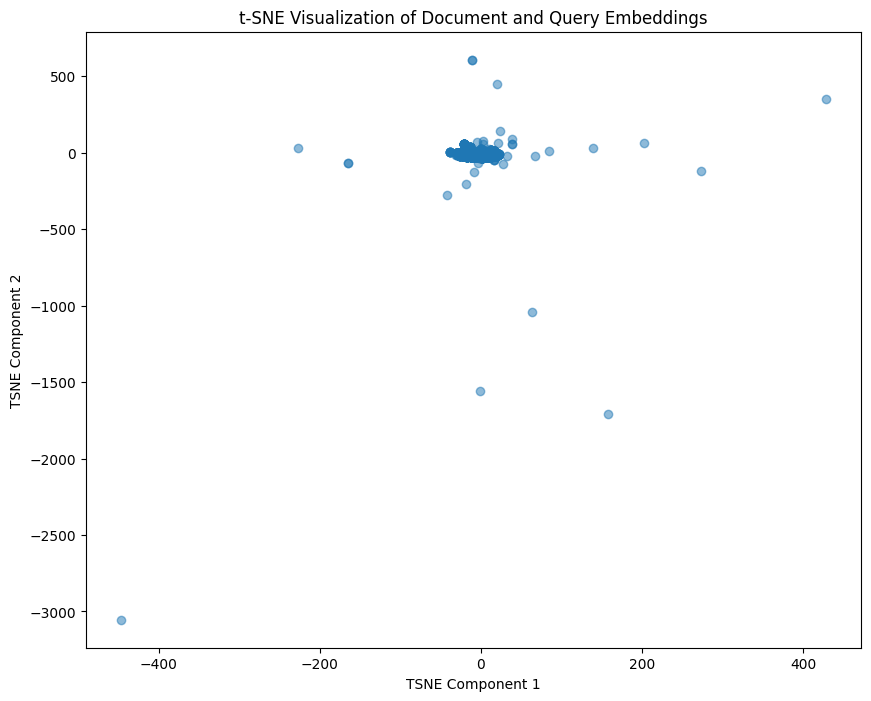

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA


cache_documents = torch.load('cache_documents_word2vec_2.pt', map_location=device)

# Assuming 'all_embeddings' is a numpy array of all document and query embeddings
pca = PCA(n_components=50)  # Reduce to 50 dimensions for better t-SNE performance

emb = cache_documents.cpu().squeeze(1) 
print(emb.shape)
reduced_embeddings = pca.fit_transform(emb[:50000])

tsne = TSNE(n_components=2, perplexity=10, n_iter=300)
tsne_results = tsne.fit_transform(reduced_embeddings)

plt.figure(figsize=(10, 8))
plt.scatter(tsne_results[:, 0], tsne_results[:, 1], alpha=0.5)
plt.title('t-SNE Visualization of Document and Query Embeddings')
plt.xlabel('TSNE Component 1')
plt.ylabel('TSNE Component 2')
plt.show()


In [23]:
from bokeh.plotting import figure, show, output_notebook
from bokeh.models import HoverTool, ColumnDataSource

output_notebook()

source = ColumnDataSource(data=dict(
    x=tsne_results[:, 0],
    y=tsne_results[:, 1],
    desc=all_documents[:50000],
))

p = figure(title='t-SNE Visualization of Document Embeddings',
           tools="pan,wheel_zoom,box_zoom,reset,hover,save")

p.circle('x', 'y', size=5, source=source)
hover = p.select(dict(type=HoverTool))
hover.tooltips = [("Document", "@desc")]
p.xaxis.axis_label = 'TSNE Component 1'
p.yaxis.axis_label = 'TSNE Component 2'

show(p)


Loading BokehJS ...

## Our own RNN

The RNN Cell

In [ ]:
class RNNCell(nn.Module):
    def __init__(self, input_size, hidden_size):
        super(RNNCell, self).__init__()
        self.input_size = input_size
        self.hidden_size = hidden_size
        
        # Initialize weights
        self.W_ih = nn.Parameter(torch.randn(input_size, hidden_size))
        self.W_hh = nn.Parameter(torch.randn(hidden_size, hidden_size))
        self.b_ih = nn.Parameter(torch.randn(hidden_size))
        self.b_hh = nn.Parameter(torch.randn(hidden_size))
    
    def forward(self, x, hidden):
        # Compute the next hidden state
        hidden_next = torch.tanh(x @ self.W_ih + self.b_ih + hidden @ self.W_hh + self.b_hh) # @ represents matrix multiplication in the last two dimensions
        return hidden_next

The RNN

In [ ]:
class RNN(nn.Module):
    def __init__(self, input_size, hidden_size):
        super(RNN, self).__init__()
        self.RNNCell = RNNCell(input_size, hidden_size)

    def forward(self, sequence, initial_hidden):
        hidden = initial_hidden
        for item in sequence:
            hidden = self.RNNCell(item, initial_hidden)
        return hidden